In [0]:
""" 
This file contains different utility functions that are not connected
in anyway to the networks presented in the tutorials, but rather help in
processing the outputs into a more understandable way.

For example ``tile_raster_images`` helps in generating a easy to grasp
image from a set of samples or weights.
"""

import numpy


def scale_to_unit_interval(ndar, eps=1e-8):
    """ Scales all values in the ndarray ndar to be between 0 and 1 """
    ndar = ndar.copy()
    ndar -= ndar.min()
    ndar *= 1.0 / (ndar.max() + eps)
    return ndar


def tile_raster_images(X, img_shape, tile_shape, tile_spacing=(0, 0),
                       scale_rows_to_unit_interval=True,
                       output_pixel_vals=True):
    """
    Transform an array with one flattened image per row, into an array in
    which images are reshaped and layed out like tiles on a floor.

    This function is useful for visualizing datasets whose rows are images,
    and also columns of matrices for transforming those rows
    (such as the first layer of a neural net).

    :type X: a 2-D ndarray or a tuple of 4 channels, elements of which can
    be 2-D ndarrays or None;
    :param X: a 2-D array in which every row is a flattened image.

    :type img_shape: tuple; (height, width)
    :param img_shape: the original shape of each image

    :type tile_shape: tuple; (rows, cols)
    :param tile_shape: the number of images to tile (rows, cols)

    :param output_pixel_vals: if output should be pixel values (i.e. int8
    values) or floats

    :param scale_rows_to_unit_interval: if the values need to be scaled before
    being plotted to [0,1] or not


    :returns: array suitable for viewing as an image.
    (See:`Image.fromarray`.)
    :rtype: a 2-d array with same dtype as X.

    """

    assert len(img_shape) == 2
    assert len(tile_shape) == 2
    assert len(tile_spacing) == 2

    # The expression below can be re-written in a more C style as
    # follows :
    #
    # out_shape    = [0,0]
    # out_shape[0] = (img_shape[0]+tile_spacing[0])*tile_shape[0] -
    #                tile_spacing[0]
    # out_shape[1] = (img_shape[1]+tile_spacing[1])*tile_shape[1] -
    #                tile_spacing[1]
    out_shape = [
        (ishp + tsp) * tshp - tsp
        for ishp, tshp, tsp in zip(img_shape, tile_shape, tile_spacing)
    ]

    if isinstance(X, tuple):
        assert len(X) == 4
        # Create an output numpy ndarray to store the image
        if output_pixel_vals:
            out_array = numpy.zeros((out_shape[0], out_shape[1], 4),
                                    dtype='uint8')
        else:
            out_array = numpy.zeros((out_shape[0], out_shape[1], 4),
                                    dtype=X.dtype)

        #colors default to 0, alpha defaults to 1 (opaque)
        if output_pixel_vals:
            channel_defaults = [0, 0, 0, 255]
        else:
            channel_defaults = [0., 0., 0., 1.]

        for i in range(4):
            if X[i] is None:
                # if channel is None, fill it with zeros of the correct
                # dtype
                dt = out_array.dtype
                if output_pixel_vals:
                    dt = 'uint8'
                out_array[:, :, i] = numpy.zeros(
                    out_shape,
                    dtype=dt
                ) + channel_defaults[i]
            else:
                # use a recurrent call to compute the channel and store it
                # in the output
                out_array[:, :, i] = tile_raster_images(
                    X[i], img_shape, tile_shape, tile_spacing,
                    scale_rows_to_unit_interval, output_pixel_vals)
        return out_array

    else:
        # if we are dealing with only one channel
        H, W = img_shape
        Hs, Ws = tile_spacing

        # generate a matrix to store the output
        dt = X.dtype
        if output_pixel_vals:
            dt = 'uint8'
        out_array = numpy.zeros(out_shape, dtype=dt)

        for tile_row in range(tile_shape[0]):
            for tile_col in range(tile_shape[1]):
                if tile_row * tile_shape[1] + tile_col < X.shape[0]:
                    this_x = X[tile_row * tile_shape[1] + tile_col]
                    if scale_rows_to_unit_interval:
                        # if we should scale values to be between 0 and 1
                        # do this by calling the `scale_to_unit_interval`
                        # function
                        this_img = scale_to_unit_interval(
                            this_x.reshape(img_shape))
                    else:
                        this_img = this_x.reshape(img_shape)
                    # add the slice to the corresponding position in the
                    # output array
                    c = 1
                    if output_pixel_vals:
                        c = 255
                    out_array[
                        tile_row * (H + Hs): tile_row * (H + Hs) + H,
                        tile_col * (W + Ws): tile_col * (W + Ws) + W
                    ] = this_img * c
        return out_array


Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.
Instructions for updating:
Please write your own downloading logic.
Instructions for updating:
Please use urllib or similar directly.
Successfully downloaded train-images-idx3-ubyte.gz 9912422 bytes.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting MNIST_data/train-images-idx3-ubyte.gz
Successfully downloaded train-labels-idx1-ubyte.gz 28881 bytes.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Instructions for updating:
Please use tf.one_hot on tensors.
Successfully downloaded t10k-images-idx3-ubyte.gz 1648877 bytes.
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Successfully downloaded t10k-labels-idx1-ubyte.gz 4542 bytes.
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Please use alternatives such as official/mnist/dataset.py fr

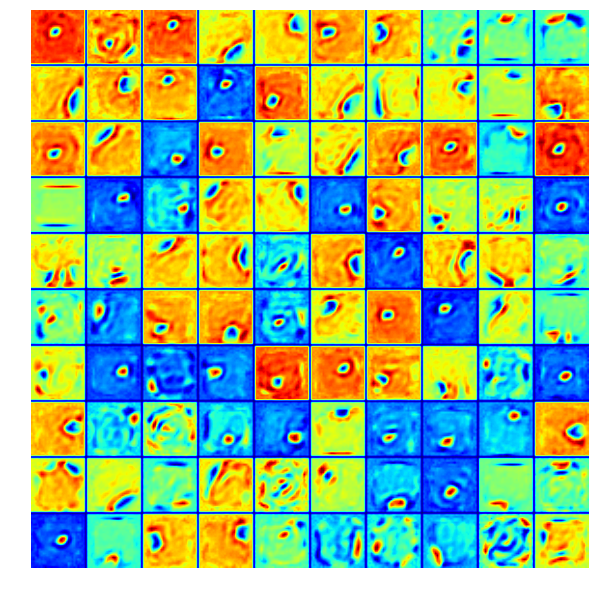

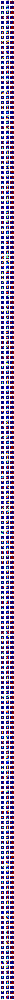

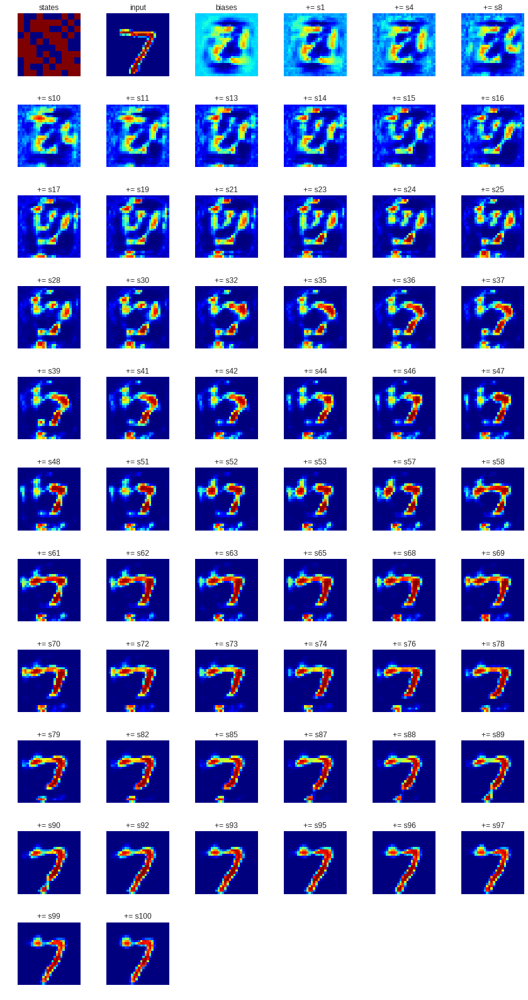

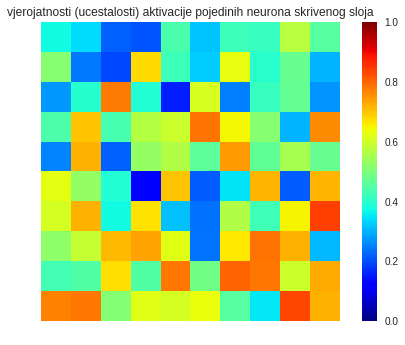

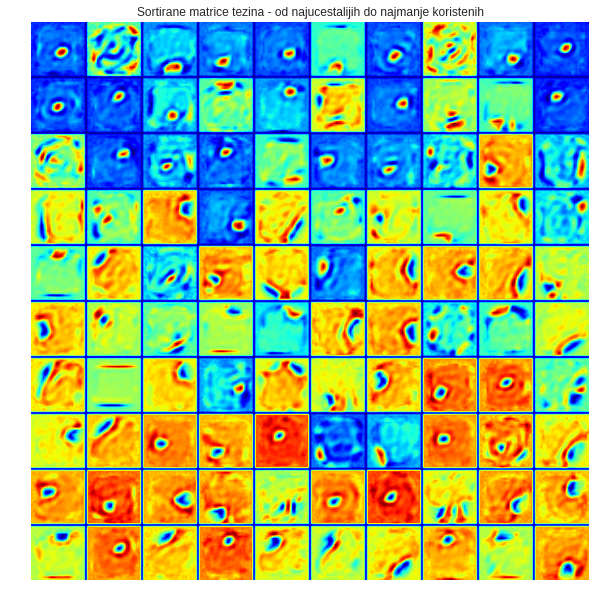

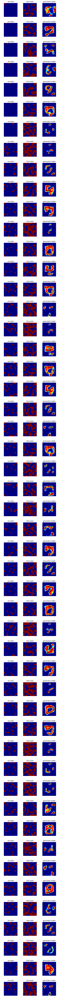

In [3]:
import tensorflow as tf
import numpy as np
from tensorflow.examples.tutorials.mnist import input_data
import math
import matplotlib.pyplot as plt
plt.rcParams['image.cmap'] = 'jet'

mnist = input_data.read_data_sets("MNIST_data/", one_hot=True)
trX, trY, teX, teY = mnist.train.images, mnist.train.labels, mnist.test.images, \
                     mnist.test.labels


def weights(shape):
    initial = tf.truncated_normal(shape, stddev=0.1)
    return tf.Variable(initial)


def bias(shape):
    initial = tf.zeros(shape, dtype=tf.float32)
    return tf.Variable(initial)


def sample_prob(probs):
    """Uzorkovanje vektora x prema vektoru vjerojatnosti p(x=1) = probs"""
    return tf.to_float(tf.random_uniform(tf.shape(probs)) <= probs)


def draw_weights(W, shape, N, stat_shape, interpolation="bilinear"):
    """Vizualizacija težina
    W -- vektori težina
    shape -- tuple dimenzije za 2D prikaz težina - obično dimenzije ulazne slike, npr. (28,28)
    N -- broj vektora težina
    shape_state -- dimezije za 2D prikaz stanja (npr. za 100 stanja (10,10)
    """
    image = (tile_raster_images(
        X=W.T,
        img_shape=shape,
        tile_shape=(int(math.ceil(N / stat_shape[0])), stat_shape[0]),
        tile_spacing=(1, 1)))
    plt.figure(figsize=(10, 14))
    plt.imshow(image, interpolation=interpolation)
    plt.axis('off')


def draw_reconstructions(ins, outs, states, shape_in, shape_state, N):
    """Vizualizacija ulaza i pripadajućih rekonstrukcija i stanja skrivenog sloja
    ins -- ualzni vektori
    outs -- rekonstruirani vektori
    states -- vektori stanja skrivenog sloja
    shape_in -- dimezije ulaznih slika npr. (28,28)
    shape_state -- dimezije za 2D prikaz stanja (npr. za 100 stanja (10,10)
    N -- broj uzoraka
    """
    plt.figure(figsize=(8, int(2 * N)))
    for i in range(N):
        plt.subplot(N, 4, 4 * i + 1)
        plt.imshow(ins[i].reshape(shape_in), vmin=0, vmax=1, interpolation="nearest")
        plt.title("Test input")
        plt.axis('off')
        plt.subplot(N, 4, 4 * i + 2)
        plt.imshow(outs[i][0:784].reshape(shape_in), vmin=0, vmax=1, interpolation="nearest")
        plt.title("Reconstruction")
        plt.axis('off')
        plt.subplot(N, 4, 4 * i + 3)
        plt.imshow(states[i].reshape(shape_state), vmin=0, vmax=1, interpolation="nearest")
        plt.title("States")
        plt.axis('off')
    plt.tight_layout()


def draw_generated(stin, stout, gen, shape_gen, shape_state, N):
    """Vizualizacija zadanih skrivenih stanja, konačnih skrivenih stanja i pripadajućih rekonstrukcija
    stin -- početni skriveni sloj
    stout -- rekonstruirani vektori
    gen -- vektori stanja skrivenog sloja
    shape_gen -- dimezije ulaznih slika npr. (28,28)
    shape_state -- dimezije za 2D prikaz stanja (npr. za 100 stanja (10,10)
    N -- broj uzoraka
    """
    plt.figure(figsize=(8, int(2 * N)))
    for i in range(N):
        plt.subplot(N, 4, 4 * i + 1)
        plt.imshow(stin[i].reshape(shape_state), vmin=0, vmax=1, interpolation="nearest")
        plt.title("set state")
        plt.axis('off')
        plt.subplot(N, 4, 4 * i + 2)
        plt.imshow(stout[i][0:784].reshape(shape_state), vmin=0, vmax=1, interpolation="nearest")
        plt.title("final state")
        plt.axis('off')
        plt.subplot(N, 4, 4 * i + 3)
        plt.imshow(gen[i].reshape(shape_gen), vmin=0, vmax=1, interpolation="nearest")
        plt.title("generated visible")
        plt.axis('off')
    plt.tight_layout()


Nh = 100  # Broj elemenata prvog skrivenog sloja
h1_shape = (10, 10)
Nv = 784  # Broj elemenata vidljivog sloja
v_shape = (28, 28)
Nu = 5000  # Broj uzoraka za vizualizaciju rekonstrukcije

gibbs_sampling_steps = 1
alpha = 0.1

g1 = tf.Graph()
with g1.as_default():
    X1 = tf.placeholder("float", [None, 784])
    w1 = weights([Nv, Nh])
    vb1 = bias([Nv])
    hb1 = bias([Nh])

    h0_prob = tf.sigmoid(tf.matmul(X1, w1) + hb1)
    h0 = sample_prob(h0_prob)
    h1 = h0

    for step in range(gibbs_sampling_steps):
        v1_prob = tf.sigmoid(tf.matmul(h1, tf.transpose(w1)) + vb1)
        v1 = sample_prob(v1_prob)
        h1_prob = tf.sigmoid(tf.matmul(v1, w1) + hb1)
        h1 = sample_prob(h1_prob)

    w1_positive_grad = tf.matmul(tf.transpose(X1), h0)
    w1_negative_grad = tf.matmul(tf.transpose(v1), h1)

    dw1 = (w1_positive_grad - w1_negative_grad) / tf.to_float(tf.shape(X1)[0])

    update_w1 = tf.assign_add(w1, alpha * dw1)
    update_vb1 = tf.assign_add(vb1, alpha * tf.reduce_mean(X1 - v1, 0))
    update_hb1 = tf.assign_add(hb1, alpha * tf.reduce_mean(h0 - h1, 0))

    out1 = (update_w1, update_vb1, update_hb1)

    v1_prob = tf.sigmoid(tf.matmul(h1, tf.transpose(w1)) + vb1)
    v1 = sample_prob(v1_prob)

    err1 = X1 - v1_prob
    err_sum1 = tf.reduce_mean(err1 * err1)

    initialize1 = tf.global_variables_initializer()

batch_size = 100
epochs = 100
n_samples = mnist.train.num_examples
total_batch = int(n_samples / batch_size) * epochs

sess1 = tf.Session(graph=g1)
sess1.run(initialize1)

for i in range(total_batch):
    batch, label = mnist.train.next_batch(batch_size)
    err, _ = sess1.run([err_sum1, out1], feed_dict={X1: batch})

    if i % (int(total_batch / 10)) == 0:
        print(i, err)

w1s = w1.eval(session=sess1)
vb1s = vb1.eval(session=sess1)
hb1s = hb1.eval(session=sess1)
vr, h1s = sess1.run([v1_prob, h1], feed_dict={X1: teX[0:Nu, :]})

# vizualizacija težina
draw_weights(w1s, v_shape, Nh, h1_shape)

# vizualizacija rekonstrukcije i stanja
draw_reconstructions(teX, vr, h1s, v_shape, h1_shape, 200)


# vizualizacija jedne rekonstrukcije s postepenim dodavanjem doprinosa aktivnih skrivenih elemenata
def sigmoid(x):
    return 1 / (1 + np.exp(-x))


def draw_rec(inp, title, size, Nrows, in_a_row, j):
    """ Iscrtavanje jedne iteracije u kreiranju vidljivog sloja
    inp - vidljivi sloj
    title - naslov sličice
    size - 2D dimenzije vidljiovg sloja
    Nrows - maks. broj redaka sličica
    in-a-row . broj sličica u jednom redu
    j - pozicija sličice u gridu
    """
    plt.subplot(Nrows, in_a_row, j)
    plt.imshow(inp.reshape(size), vmin=0, vmax=1, interpolation="nearest")
    plt.title(title)
    plt.axis('off')


def reconstruct(ind, states, orig, weights, biases):
    """ Slijedno iscrtavanje rekonstrukcije vidljivog sloja
    ind - indeks znamenke u orig (matrici sa znamenkama kao recima)
    states - vektori stanja ulaznih vektora
    orig - originalnalni ulazni vektori
    weights - matrica težina
    biases - vektori pomaka vidljivog sloja
    """
    j = 1
    in_a_row = 6
    Nimg = states.shape[1] + 3
    Nrows = int(np.ceil(float(Nimg + 2) / in_a_row))

    plt.figure(figsize=(12, 2 * Nrows))

    draw_rec(states[ind], 'states', h1_shape, Nrows, in_a_row, j)
    j += 1
    draw_rec(orig[ind], 'input', v_shape, Nrows, in_a_row, j)

    reconstr = biases.copy()
    j += 1
    draw_rec(sigmoid(reconstr), 'biases', v_shape, Nrows, in_a_row, j)

    for i in range(Nh):
        if states[ind, i] > 0:
            j += 1
            reconstr = reconstr + weights[:, i]
            titl = '+= s' + str(i + 1)
            draw_rec(sigmoid(reconstr), titl, v_shape, Nrows, in_a_row, j)
    plt.tight_layout()


reconstruct(0, h1s, teX, w1s, vb1s)  # prvi argument je indeks znamenke u matrici znamenki

# Vjerojatnost da je skriveno stanje uključeno kroz Nu ulaznih uzoraka
plt.figure()
tmp = (h1s.sum(0) / h1s.shape[0]).reshape(h1_shape)
plt.imshow(tmp, vmin=0, vmax=1, interpolation="nearest")
plt.axis('off')
plt.colorbar()
plt.title('vjerojatnosti (ucestalosti) aktivacije pojedinih neurona skrivenog sloja')

# Vizualizacija težina sortitranih prema učestalosti
tmp_ind = (-tmp).argsort(None)
draw_weights(w1s[:, tmp_ind], v_shape, Nh, h1_shape)
plt.title('Sortirane matrice tezina - od najucestalijih do najmanje koristenih')

# Generiranje uzoraka iz slučajnih vektora
r_input = np.random.rand(100, Nh)
r_input[r_input > 0.9] = 1  # postotak aktivnih - slobodno varirajte
r_input[r_input < 1] = 0
r_input = r_input * 20  # pojačanje za slučaj ako je mali postotak aktivnih

s = 10
i = 0
r_input[i, :] = 0
r_input[i, i] = s
i += 1
r_input[i, :] = 0
r_input[i, i] = s
i += 1
r_input[i, :] = 0
r_input[i, i] = s
i += 1
r_input[i, :] = 0
r_input[i, i] = s
i += 1
r_input[i, :] = 0
r_input[i, i] = s
i += 1
r_input[i, :] = 0
r_input[i, i] = s
i += 1
r_input[i, :] = 0
r_input[i, i] = s

out_1 = sess1.run((v1), feed_dict={h0: r_input})

# Emulacija dodatnih Gibbsovih uzorkovanja pomoću feed_dict
for i in range(1000):
    out_1_prob, out_1, hout1 = sess1.run((v1_prob, v1, h1), feed_dict={X1: out_1})

draw_generated(r_input, hout1, out_1_prob, v_shape, h1_shape, 50)

0 0.26351973
5500 0.021506412
11000 0.019215295
16500 0.019995302
22000 0.01835096
27500 0.017464101
33000 0.01777785
38500 0.018082278
44000 0.016896201
49500 0.018481033


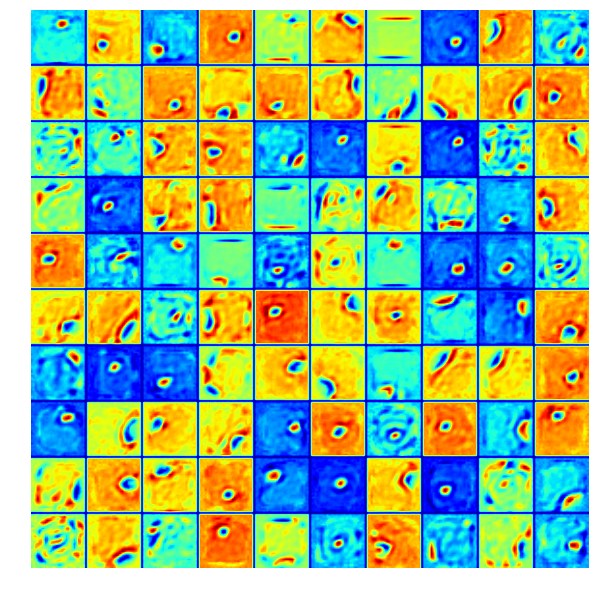

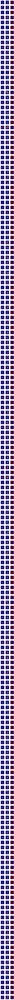

In [4]:
# Bez uzorkovanja ulaza
Nh = 100  # Broj elemenata prvog skrivenog sloja
h1_shape = (10, 10)
Nv = 784  # Broj elemenata vidljivog sloja
v_shape = (28, 28)
Nu = 5000  # Broj uzoraka za vizualizaciju rekonstrukcije

gibbs_sampling_steps = 1
alpha = 0.1

g1 = tf.Graph()
with g1.as_default():
    X1 = tf.placeholder("float", [None, 784])
    w1 = weights([Nv, Nh])
    vb1 = bias([Nv])
    hb1 = bias([Nh])

    h0_prob = tf.sigmoid(tf.matmul(X1, w1) + hb1)
    h0 = sample_prob(h0_prob)
    h1 = h0_prob

    for step in range(gibbs_sampling_steps):
        v1_prob = tf.sigmoid(tf.matmul(h1, tf.transpose(w1)) + vb1)
        v1 = sample_prob(v1_prob)
        h1_prob = tf.sigmoid(tf.matmul(v1, w1) + hb1)
        h1 = sample_prob(h1_prob)

    w1_positive_grad = tf.matmul(tf.transpose(X1), h0)
    w1_negative_grad = tf.matmul(tf.transpose(v1), h1)

    dw1 = (w1_positive_grad - w1_negative_grad) / tf.to_float(tf.shape(X1)[0])

    update_w1 = tf.assign_add(w1, alpha * dw1)
    update_vb1 = tf.assign_add(vb1, alpha * tf.reduce_mean(X1 - v1, 0))
    update_hb1 = tf.assign_add(hb1, alpha * tf.reduce_mean(h0 - h1, 0))

    out1 = (update_w1, update_vb1, update_hb1)

    v1_prob = tf.sigmoid(tf.matmul(h1, tf.transpose(w1)) + vb1)
    v1 = sample_prob(v1_prob)

    err1 = X1 - v1_prob
    err_sum1 = tf.reduce_mean(err1 * err1)

    initialize1 = tf.global_variables_initializer()

batch_size = 100
epochs = 100
n_samples = mnist.train.num_examples
total_batch = int(n_samples / batch_size) * epochs

sess1 = tf.Session(graph=g1)
sess1.run(initialize1)

for i in range(total_batch):
    batch, label = mnist.train.next_batch(batch_size)
    err, _ = sess1.run([err_sum1, out1], feed_dict={X1: batch})

    if i % (int(total_batch / 10)) == 0:
        print(i, err)

w1s = w1.eval(session=sess1)
vb1s = vb1.eval(session=sess1)
hb1s = hb1.eval(session=sess1)
vr, h1s = sess1.run([v1_prob, h1], feed_dict={X1: teX[0:Nu, :]})

# vizualizacija težina
draw_weights(w1s, v_shape, Nh, h1_shape)

# vizualizacija rekonstrukcije i stanja
draw_reconstructions(teX, vr, h1s, v_shape, h1_shape, 200)

0 0.26819867
5500 0.03307691
11000 0.030415164
16500 0.029978743
22000 0.03121932
27500 0.028413787
33000 0.02961496
38500 0.02914431
44000 0.029354062
49500 0.029054534


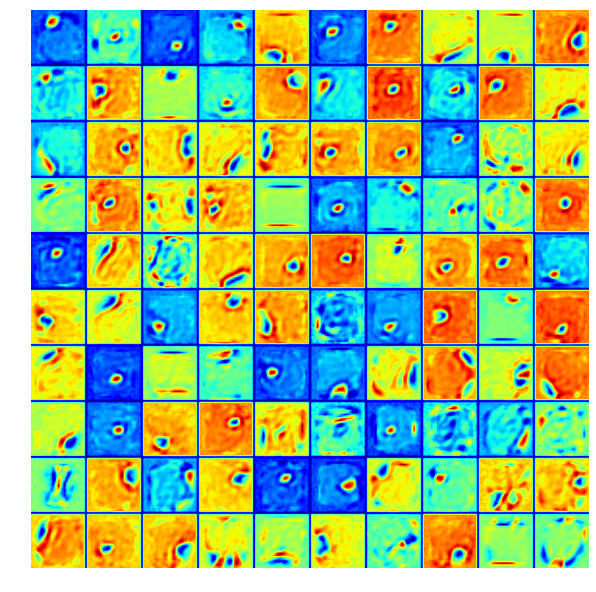

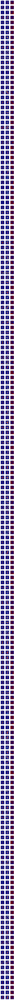

In [5]:
# Veći broj gibsovih uzorkovanja 
Nh = 100  # Broj elemenata prvog skrivenog sloja
h1_shape = (10, 10)
Nv = 784  # Broj elemenata vidljivog sloja
v_shape = (28, 28)
Nu = 5000  # Broj uzoraka za vizualizaciju rekonstrukcije

gibbs_sampling_steps = 5
alpha = 0.1

g1 = tf.Graph()
with g1.as_default():
    X1 = tf.placeholder("float", [None, 784])
    w1 = weights([Nv, Nh])
    vb1 = bias([Nv])
    hb1 = bias([Nh])

    h0_prob = tf.sigmoid(tf.matmul(X1, w1) + hb1)
    h0 = sample_prob(h0_prob)
    h1 = h0

    for step in range(gibbs_sampling_steps):
        v1_prob = tf.sigmoid(tf.matmul(h1, tf.transpose(w1)) + vb1)
        v1 = sample_prob(v1_prob)
        h1_prob = tf.sigmoid(tf.matmul(v1, w1) + hb1)
        h1 = sample_prob(h1_prob)

    w1_positive_grad = tf.matmul(tf.transpose(X1), h0)
    w1_negative_grad = tf.matmul(tf.transpose(v1), h1)

    dw1 = (w1_positive_grad - w1_negative_grad) / tf.to_float(tf.shape(X1)[0])

    update_w1 = tf.assign_add(w1, alpha * dw1)
    update_vb1 = tf.assign_add(vb1, alpha * tf.reduce_mean(X1 - v1, 0))
    update_hb1 = tf.assign_add(hb1, alpha * tf.reduce_mean(h0 - h1, 0))

    out1 = (update_w1, update_vb1, update_hb1)

    v1_prob = tf.sigmoid(tf.matmul(h1, tf.transpose(w1)) + vb1)
    v1 = sample_prob(v1_prob)

    err1 = X1 - v1_prob
    err_sum1 = tf.reduce_mean(err1 * err1)

    initialize1 = tf.global_variables_initializer()

batch_size = 100
epochs = 100
n_samples = mnist.train.num_examples
total_batch = int(n_samples / batch_size) * epochs

sess1 = tf.Session(graph=g1)
sess1.run(initialize1)

for i in range(total_batch):
    batch, label = mnist.train.next_batch(batch_size)
    err, _ = sess1.run([err_sum1, out1], feed_dict={X1: batch})

    if i % (int(total_batch / 10)) == 0:
        print(i, err)

w1s = w1.eval(session=sess1)
vb1s = vb1.eval(session=sess1)
hb1s = hb1.eval(session=sess1)
vr, h1s = sess1.run([v1_prob, h1], feed_dict={X1: teX[0:Nu, :]})

# vizualizacija težina
draw_weights(w1s, v_shape, Nh, h1_shape)

# vizualizacija rekonstrukcije i stanja
draw_reconstructions(teX, vr, h1s, v_shape, h1_shape, 200)

**Drugi zadatak - DBN**

In [9]:
Nh = 100  # Broj elemenata prvog skrivenog sloja
h1_shape = (10, 10)
Nv = 784  # Broj elemenata vidljivog sloja
v_shape = (28, 28)
Nu = 5000  # Broj uzoraka za vizualizaciju rekonstrukcije

gibbs_sampling_steps = 1
alpha = 0.1

g1 = tf.Graph()
with g1.as_default():
    X1 = tf.placeholder("float", [None, 784])
    w1 = weights([Nv, Nh])
    vb1 = bias([Nv])
    hb1 = bias([Nh])

    h0_prob = tf.sigmoid(tf.matmul(X1, w1) + hb1)
    h0 = sample_prob(h0_prob)
    h1 = h0

    for step in range(gibbs_sampling_steps):
        v1_prob = tf.sigmoid(tf.matmul(h1, tf.transpose(w1)) + vb1)
        v1 = sample_prob(v1_prob)
        h1_prob = tf.sigmoid(tf.matmul(v1, w1) + hb1)
        h1 = sample_prob(h1_prob)

    w1_positive_grad = tf.matmul(tf.transpose(X1), h0)
    w1_negative_grad = tf.matmul(tf.transpose(v1), h1)

    dw1 = (w1_positive_grad - w1_negative_grad) / tf.to_float(tf.shape(X1)[0])

    update_w1 = tf.assign_add(w1, alpha * dw1)
    update_vb1 = tf.assign_add(vb1, alpha * tf.reduce_mean(X1 - v1, 0))
    update_hb1 = tf.assign_add(hb1, alpha * tf.reduce_mean(h0 - h1, 0))

    out1 = (update_w1, update_vb1, update_hb1)

    v1_prob = tf.sigmoid(tf.matmul(h1, tf.transpose(w1)) + vb1)
    v1 = sample_prob(v1_prob)

    err1 = X1 - v1_prob
    err_sum1 = tf.reduce_mean(err1 * err1)

    initialize1 = tf.global_variables_initializer()

batch_size = 100
epochs = 100
n_samples = mnist.train.num_examples
total_batch = int(n_samples / batch_size) * epochs

sess1 = tf.Session(graph=g1)
sess1.run(initialize1)

for i in range(total_batch):
    batch, label = mnist.train.next_batch(batch_size)
    err, _ = sess1.run([err_sum1, out1], feed_dict={X1: batch})

    if i % (int(total_batch / 10)) == 0:
        print(i, err)

0 0.25463328
5500 0.023545487
11000 0.022044675
16500 0.019115044
22000 0.019948618
27500 0.022207834
33000 0.018919803
38500 0.020281522
44000 0.020164542
49500 0.018996371


In [0]:
w1s = w1.eval(session=sess1)
vb1s = vb1.eval(session=sess1)
hb1s = hb1.eval(session=sess1)
vr, h1s = sess1.run([v1_prob, h1], feed_dict={X1: teX[0:Nu, :]})

0 0.10604233
5500 0.038835693
11000 0.036621824
16500 0.034090724
22000 0.0339191
27500 0.03697147
33000 0.036887527
38500 0.038683977
44000 0.03510789
49500 0.0385136


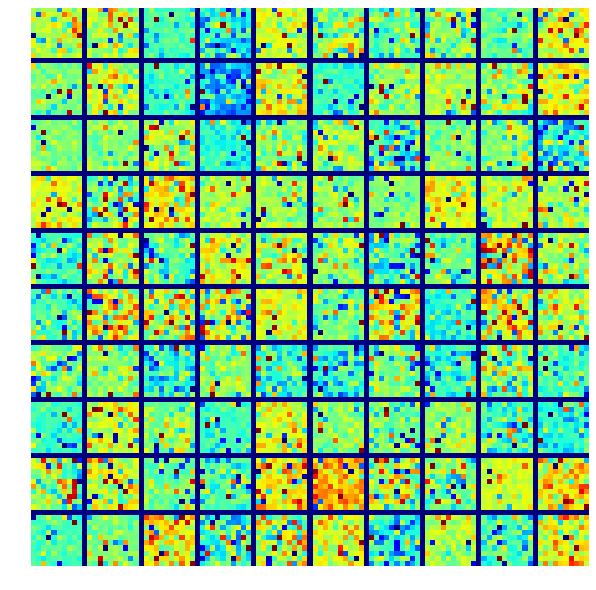

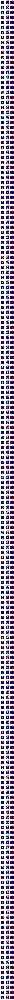

In [12]:
Nh2 = Nh # Broj elemenata drugog skrivenog sloja
h2_shape = h1_shape 

gibbs_sampling_steps = 2
alpha = 0.1

g2 = tf.Graph()
with g2.as_default():
    
    X2 = tf.placeholder("float", [None, Nv])
    w1a = tf.Variable(w1s)
    vb1a = tf.Variable(vb1s)
    hb1a = tf.Variable(hb1s)
    w2 = weights([Nh, Nh2])
    hb2 = bias([Nh2])
    
    h1up_prob  = tf.sigmoid(tf.matmul(X2, w1a) + hb1a)
    h1up = sample_prob(h1up_prob)
    h2up_prob = tf.sigmoid(tf.matmul(h1up, w2) + hb2)
    h2up = sample_prob(h2up_prob)
    h2down = h2up
    
    for step in range(gibbs_sampling_steps):
        h1down_prob = tf.sigmoid(tf.matmul(h2down, tf.transpose(w2)) + hb2)
        h1down = sample_prob(h1down_prob)
        h2down_prob = tf.sigmoid(tf.matmul(h1down, w2) + hb2)
        h2down = sample_prob(h2down_prob)
    
    w2_positive_grad = tf.matmul(tf.transpose(h1up), h2up)
    w2_negative_grad = tf.matmul(tf.transpose(h1down), h2down)

    dw2 = (w2_positive_grad - w2_negative_grad) / tf.to_float(tf.shape(h1up)[0])

    update_w2 = tf.assign_add(w2, alpha * dw2)
    update_hb1a = tf.assign_add(hb1a, alpha * tf.reduce_mean(h1up - h1down, 0))
    update_hb2 = tf.assign_add(hb2, alpha * tf.reduce_mean(h2up - h2down, 0))

    out2 = (update_w2, update_hb1a, update_hb2)

    # rekonsturkcija ulaza na temelju krovnog skrivenog stanja h3
    # ...
    # ...
    v_out_prob = tf.sigmoid(tf.matmul(h1down, tf.transpose(w1a)) + vb1a)
    v_out = sample_prob(v_out_prob)
    
    err2 = X2 - v_out_prob
    err_sum2 = tf.reduce_mean(err2 * err2)
    
    initialize2 = tf.global_variables_initializer()

batch_size = 100
epochs = 100
n_samples = mnist.train.num_examples

total_batch = int(n_samples / batch_size) * epochs

sess2 = tf.Session(graph=g2)
sess2.run(initialize2)
for i in range(total_batch):
    # iteracije treniranja 
    batch, label = mnist.train.next_batch(batch_size)
    err, _ = sess2.run([err_sum2, out2], feed_dict={X2: batch})

    if i%(int(total_batch/10)) == 0:
        print(i, err)
        
    w2s, hb1as, hb2s = sess2.run([w2, hb1a, hb2], feed_dict={X2: batch})
    vr2, h2downs = sess2.run([v_out_prob, h2down], feed_dict={X2: teX[0:Nu,:]})

# vizualizacija težina
draw_weights(w2s, h1_shape, Nh2, h2_shape, interpolation="nearest")

# vizualizacija rekonstrukcije i stanja
draw_reconstructions(teX, vr2, h2downs, v_shape, h2_shape, 200)

# Generiranje uzoraka iz slučajnih vektora krovnog skrivenog sloja
#...
#...
# Emulacija dodatnih Gibbsovih uzorkovanja pomoću feed_dict
#...
#...

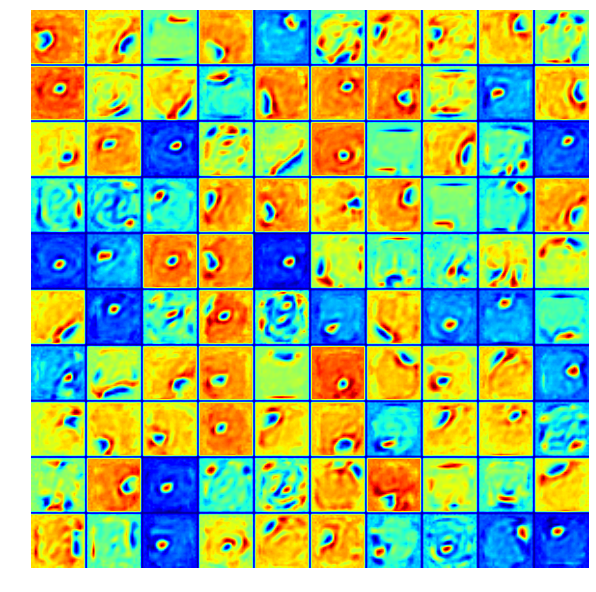

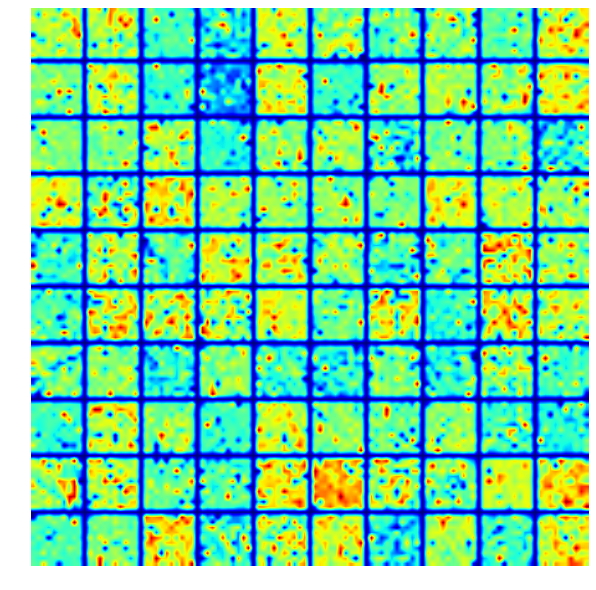

In [17]:
w2s = w2.eval(session=sess2)
hb1as = hb1a.eval(session=sess2)
vb1as = vb1a.eval(session=sess2)

# vizualizacija težina
draw_weights(w1s, v_shape, Nh, h1_shape)
draw_weights(w2s, h1_shape, Nh2, h2_shape)

**3. zadatak - Fine tuning DBN**

0 0.036453124
5500 0.014441849
11000 0.008896808
16500 0.0063209306
22000 0.0043270723
27500 0.0034074632
33000 0.003252954
38500 0.0025440867
44000 0.0022061563
49500 0.0022705437


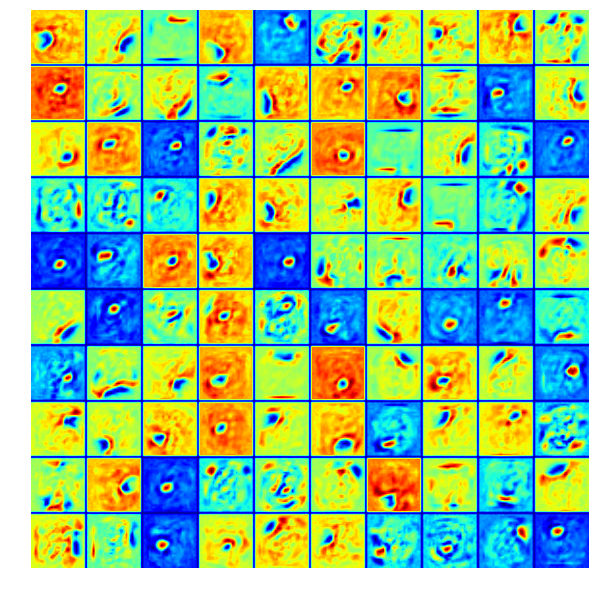

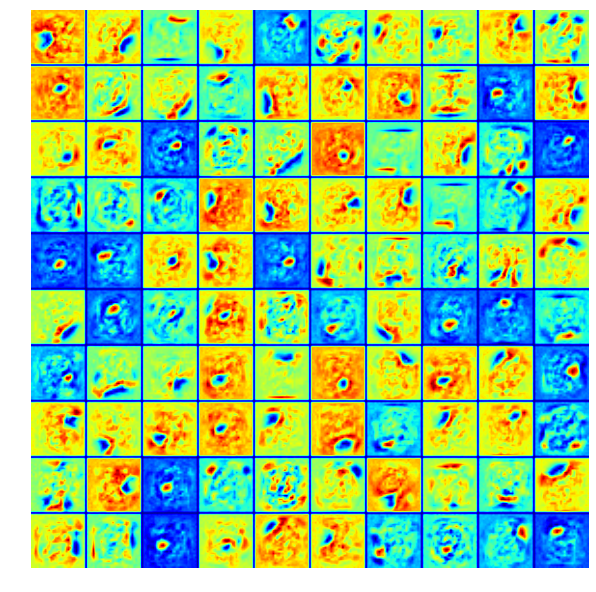

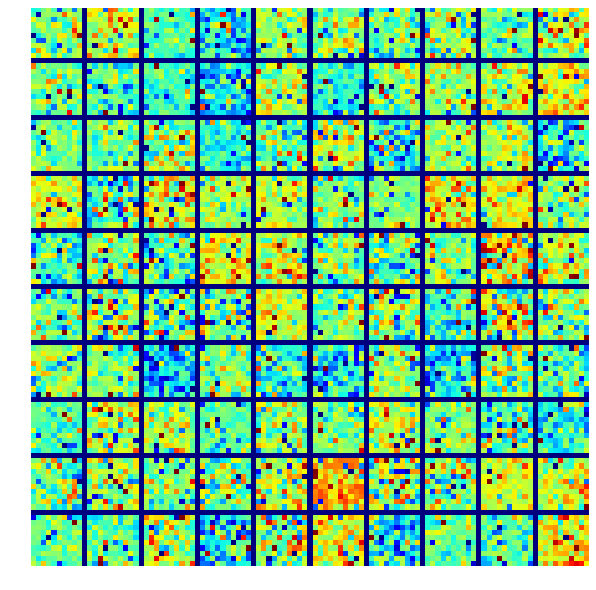

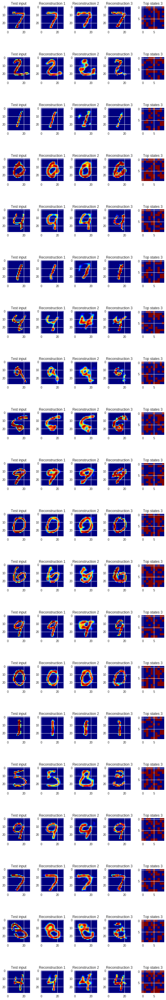

In [19]:
beta = 0.01

g3 = tf.Graph()
with g3.as_default():

    X3 = tf.placeholder("float", [None, Nv])
    r1_up = tf.Variable(w1s)
    w1_down = tf.Variable(tf.transpose(w1s))
    w2a = tf.Variable(w2s)
    hb1_up = tf.Variable(hb1s)
    hb1_down = tf.Variable(hb1as)
    vb1_down = tf.Variable(vb1s)
    hb2a = tf.Variable(hb2s)
    
    # wake pass
    h1_up_prob = tf.sigmoid(tf.matmul(X3, r1_up) + hb1_up)
    h1_up = sample_prob(h1_up_prob)  # n
    v1_up_down_prob = tf.sigmoid(tf.matmul(h1_up, w1_down) + vb1_down)
    v1_up_down = sample_prob(v1_up_down_prob)  # (n-1) novo
    
    
    # top RBM Gibs passes
    h2_up_prob = tf.sigmoid(tf.matmul(h1_up, w2a) + hb2a)
    h2_up = sample_prob(h2_up_prob)
    h2_down = h2_up
    for step in range(gibbs_sampling_steps):
        h1_down_prob = tf.sigmoid(tf.matmul(h2_down, tf.transpose(w2a)) + hb2a)
        h1_down = sample_prob(h1_down_prob)  # n-1
        h2_down_prob = tf.sigmoid(tf.matmul(h1_down, w2a) + hb2a)
        h2_down = sample_prob(h2_down_prob)  # n novo
       
    # sleep pass
    v1_down_prob = tf.sigmoid(tf.matmul(h1_down, w1_down) + vb1_down)
    v1_down = sample_prob(v1_down_prob)
    h1_down_up_prob = tf.sigmoid(tf.matmul(v1_down, r1_up) + hb1_up)
    h1_down_up = sample_prob(h1_down_up_prob)
    
    
    # generative weights update during wake pass
    update_w1_down = tf.assign_add(w1_down, beta * tf.matmul(tf.transpose(h1_up), X3 - v1_up_down_prob) / tf.to_float(tf.shape(X3)[0]))
    update_vb1_down = tf.assign_add(vb1_down, beta * tf.reduce_mean(X3 - v1_up_down_prob, 0))
    
    # top RBM update
    w2_positive_grad = tf.matmul(tf.transpose(h1_up), h2_up)
    w2_negative_grad = tf.matmul(tf.transpose(h1_down), h2_down)
    dw3 = (w2_positive_grad - w2_negative_grad) / tf.to_float(tf.shape(h1_up)[0])
    update_w2 = tf.assign_add(w2a, beta * dw3)
    update_hb1_down = tf.assign_add(hb1_down, beta * tf.reduce_mean(h1_up - h1_down, 0))
    update_hb2 = tf.assign_add(hb2a, beta * tf.reduce_mean(h2_up - h2_down, 0))
    
    # recognition weights update during sleep pass
    update_r1_up = tf.assign_add(r1_up, beta * tf.matmul(tf.transpose(v1_down_prob), h1_down - h1_down_up) / tf.to_float(tf.shape(X3)[0]))
    update_hb1_up = tf.assign_add(hb1_up, beta * tf.reduce_mean(h1_down - h1_down_up, 0))
    
    out3 = (update_w1_down, update_vb1_down, update_w2, update_hb1_down, update_hb2, update_r1_up, update_hb1_up)
    
    err3 = X3 - v1_down_prob
    err_sum3 = tf.reduce_mean(err3 * err3)
    
    initialize3 = tf.global_variables_initializer()

batch_size = 100
epochs = 100
n_samples = mnist.train.num_examples

total_batch = int(n_samples / batch_size) * epochs

sess3 = tf.Session(graph=g3)
sess3.run(initialize3)
for i in range(total_batch):
    #...
    err, _ = sess3.run([err_sum3, out3], feed_dict={X3: batch})
        
    if i%(int(total_batch/10)) == 0:
        print(i, err)
    
    w2ss, r1_ups, w1_downs, hb2ss, hb1_ups, hb1_downs, vb1_downs = sess3.run(
        [w2a, r1_up, w1_down, hb2a, hb1_up, hb1_down, vb1_down], feed_dict={X3: batch})
    vr3, h2_downs, h2_down_probs = sess3.run([v1_down_prob, h2_down, h2_down_prob], feed_dict={X3: teX[0:Nu,:]})


# vizualizacija težina
draw_weights(r1_ups, v_shape, Nh, h1_shape)
draw_weights(w1_downs.T, v_shape, Nh, h1_shape)
draw_weights(w2ss, h1_shape, Nh2, h2_shape, interpolation="nearest")

# vizualizacija rekonstrukcije i stanja
Npics = 5
plt.figure(figsize=(8, 12*4))
for i in range(20):

    plt.subplot(20, Npics, Npics*i + 1)
    plt.imshow(teX[i].reshape(v_shape), vmin=0, vmax=1)
    plt.title("Test input")
    plt.subplot(20, Npics, Npics*i + 2)
    plt.imshow(vr[i][0:784].reshape(v_shape), vmin=0, vmax=1)
    plt.title("Reconstruction 1")
    plt.subplot(20, Npics, Npics*i + 3)
    plt.imshow(vr2[i][0:784].reshape(v_shape), vmin=0, vmax=1)
    plt.title("Reconstruction 2")
    plt.subplot(20, Npics, Npics*i + 4)
    plt.imshow(vr3[i][0:784].reshape(v_shape), vmin=0, vmax=1)
    plt.title("Reconstruction 3")
    plt.subplot(20, Npics, Npics*i + 5)
    plt.imshow(h2_downs[i][0:Nh2].reshape(h2_shape), vmin=0, vmax=1, interpolation="nearest")
    plt.title("Top states 3")
plt.tight_layout()

# Generiranje uzoraka iz slučajnih vektora krovnog skrivenog sloja
#...
#...
# Emulacija dodatnih Gibbsovih uzorkovanja pomoću feed_dict
#...
#...

**4. zadatak - VAE**

Extracting ../MNIST_data/train-images-idx3-ubyte.gz
Extracting ../MNIST_data/train-labels-idx1-ubyte.gz
Extracting ../MNIST_data/t10k-images-idx3-ubyte.gz
Extracting ../MNIST_data/t10k-labels-idx1-ubyte.gz
Epoch: 0001 cost= 193.394502896
Epoch: 0011 cost= 150.106533370
Epoch: 0021 cost= 145.583369307
Epoch: 0031 cost= 143.453132130
Epoch: 0041 cost= 142.095263783
Epoch: 0051 cost= 141.027652505
Epoch: 0061 cost= 140.288910606
Epoch: 0071 cost= 139.668920829
Epoch: 0081 cost= 139.021021188
Epoch: 0091 cost= 138.508141466


ValueError: ignored

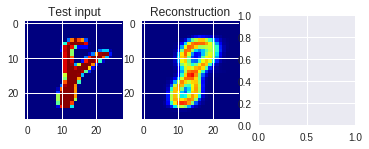

In [17]:
import numpy as np
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data
import os
import matplotlib.pyplot as plt
plt.rcParams['image.cmap'] = 'jet'

mnist = input_data.read_data_sets('../MNIST_data/', one_hot=True)
n_samples = mnist.train.num_examples

learning_rate = 0.001
batch_size = 100

n_hidden_recog_1=200 # 1 sloj enkodera
n_hidden_recog_2=200 # 2 sloj enkodera
n_hidden_gener_1=200 # 1 sloj dekodera
n_hidden_gener_2=200 # 2 sloj dekodera
n_z=2 # broj skrivenih varijabli
n_input=784 # MNIST data input (img shape: 28*28)
in_shape = (28,28)

def get_canvas(Z, ind, nx, ny, in_shape, batch_size, sess):
    """Crtanje rekonstrukcija na odgovarajućim pozicijama u 2D prostoru skrivenih varijabli
    Z -- skriveni vektori raspoređeni u gridu oko ishodišta
    ind -- indeksi za rezanje Z-a na batch_size blokove za slanje u graf -zbog problema sa random generatorom
    nx -- raspon grida po x osi - skrivena varijabla z0
    ny -- raspon grida po y osi - skrivena varijabla z1
    in_shape -- dimenzije jedne rekonstrukcije i.e. ulazne sličice
    batch_size -- veličina minibatcha na koji je graf naviknut
    sess -- session grafa mreže
    """
    # get reconstructions for visualiations
    X = np.empty((0,in_shape[0]*in_shape[1])) # empty array for concatenation 
    # split hidden vectors into minibatches of batch_size due to TF random generator limitation
    for batch in np.array_split(Z,ind):
        # fill up last batch to full batch_size if neccessary
        # this addition will not be visualized, but is here to avoid TF error
        if batch.shape[0] < batch_size:
            batch = np.concatenate((batch, np.zeros((batch_size-batch.shape[0], batch.shape[1]))), 0)
        # get batch_size reconstructions and add them to array of previous reconstructions
        X = np.vstack((X, sess.run(x_reconstr_mean_out, feed_dict={z: batch})))
    # make canvas with reconstruction tiles arranged by the hidden state coordinates of each reconstruction
    # this is achieved for all reconstructions by clever use of reshape, swapaxes and axis inversion
    return (X[0:nx*ny,:].reshape((nx*ny,in_shape[0],in_shape[1])).swapaxes(0,1)
            .reshape((in_shape[0],ny,nx*in_shape[1])).swapaxes(0,1)[::-1,:,:]
            .reshape((ny*in_shape[0],nx*in_shape[1])))

def draw_reconstructions(ins, outs, states, shape_in, shape_state):
    """Vizualizacija ulaza i pripadajućih rekonstrkcija i stanja skrivenog sloja
    ins -- ualzni vektori
    outs -- rekonstruirani vektori
    states -- vektori stanja skrivenog sloja
    shape_in -- dimezije ulaznih slika npr. (28,28)
    shape_state -- dimezije za 2D prikaz stanja (npr. za 100 stanja (10,10)
    """
    plt.figure(figsize=(8, 12*4))
    for i in range(20):

        plt.subplot(20, 4, 4*i + 1)
        plt.imshow(ins[i].reshape(shape_in), vmin=0, vmax=1, interpolation="nearest")
        plt.title("Test input")
        plt.subplot(20, 4, 4*i + 2)
        plt.imshow(outs[i][0:784].reshape(shape_in), vmin=0, vmax=1, interpolation="nearest")
        plt.title("Reconstruction")
        plt.subplot(20, 4, 4*i + 3)
        plt.imshow(states[i][0:(shape_state[0] * shape_state[1])].reshape(shape_state),
                   vmin=-4, vmax=4, interpolation="nearest")
        plt.colorbar()
        plt.title("States")
    plt.tight_layout()
    
def plot_latent(inmat, labels):
    """Crtanje pozicija uzoraka u 2D latentnom prostoru
    inmat -- matrica latentnih stanja
    labels -- labela klas
    """
    plt.figure(figsize=(8, 6)) 
    plt.axis([-4, 4, -4, 4])
    plt.gca().set_autoscale_on(False)

    plt.scatter(inmat[:, 0], inmat[:, 1], c=np.argmax(labels, 1))
    plt.colorbar()
    plt.xlabel('z0')
    plt.ylabel('z1')

def save_latent_plot(name):
    """Spremanje trenutnog figure-a
    name -- ime datoteke
    """
    plt.savefig(name)
    
def weight_variable(shape, name):
    """Kreiranje težina"""
    # http://andyljones.tumblr.com/post/110998971763/an-explanation-of-xavier-initialization
    return tf.get_variable(name, shape=shape,
            initializer=tf.contrib.layers.xavier_initializer())

def bias_variable(shape):
    """Kreiranje pomaka"""
    initial = tf.zeros(shape, dtype=tf.float32)
    return tf.Variable(initial)

def variable_summaries(var, name):
    """Prikupljanje podataka za Tensorboard"""
    with tf.name_scope(name):
        mean = tf.reduce_mean(var)
        tf.summary.scalar('mean', mean)
        stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
        tf.summary.scalar('stddev', stddev)
        tf.summary.scalar('max', tf.reduce_max(var))
        tf.summary.scalar('min', tf.reduce_min(var))
        tf.summary.histogram(name, var)

def vae_layer(input_tensor, input_dim, output_dim, layer_name, act=tf.nn.softplus):
    """Kreiranje jednog skrivenog sloja"""
    # Adding a name scope ensures logical grouping of the layers in the graph.
    with tf.name_scope(layer_name):
        # This Variable will hold the state of the weights for the layer
        weights = weight_variable([input_dim, output_dim], layer_name + '/weights')
        variable_summaries(weights,'weights')
        tf.summary.tensor_summary('weightsT', weights)
        biases = bias_variable([output_dim])
        variable_summaries(biases, 'biases')
        preactivate = tf.matmul(input_tensor, weights) + biases
        tf.summary.histogram('pre_activations', preactivate)
        activations = act(preactivate, name='activation')
        tf.summary.histogram('activations', activations)
    return activations

tf.reset_default_graph() 
    
sess = tf.Session()
        
# definicije ulaznog tenzora
x = tf.placeholder(dtype=tf.float32, shape=[None, n_input])

# definirajte enkoiderski dio
layer_e1 = vae_layer(x, n_input, n_hidden_recog_1, 'layer_e1') 
layer_e2 = vae_layer(layer_e1, n_hidden_recog_1, n_hidden_recog_2, 'layer_e2')

with tf.name_scope('z'):
    # definirajte skrivene varijable i pripadajući generator šuma
    z_mean = vae_layer(
        layer_e2, 
        n_hidden_recog_2, 
        n_z, 
        'z_mean', 
        act=tf.identity)
    
    z_log_sigma_sq = vae_layer(
        layer_e2, 
        n_hidden_recog_2,
        n_z, 
        'z_sigma', 
        act=tf.identity)
    eps = tf.random_normal((batch_size, n_z), 0, 1, dtype=tf.float32)
                         
    z = tf.add(z_mean, tf.multiply(tf.sqrt(tf.exp(z_log_sigma_sq)), eps))
    tf.summary.histogram('activations', z)

# definirajte dekoderski dio
layer_d1 = vae_layer(z, n_z, n_hidden_gener_1, 'layer_d1') 
layer_d2 = vae_layer(layer_d1, n_hidden_gener_1, n_hidden_gener_2, 'layer_d2')
            
# definirajte srednju vrijednost rekonstrukcije
# Povezujemo zadnji sloj dekodera sa vjerojatnostima izlazne varijable p(xi = 1)
# Broj izlaza == broj ulaza - zelimo rekonstruirati ulaz
x_reconstr_mean = vae_layer(
    layer_d2, 
    n_hidden_gener_2, 
    n_input, 
    'out_reconstruct',
    act=tf.identity)

x_reconstr_mean_out = tf.nn.sigmoid(x_reconstr_mean)

# definirajte dvije komponente funkcije cijene
with tf.name_scope('cost'):
    cost1 = tf.nn.sigmoid_cross_entropy_with_logits(
        labels=x, 
        logits=x_reconstr_mean)
    tf.summary.histogram('cross_entropy', cost1)
    # KL - zelimo slicnost izmedju kompresirane distribucije sa N(0, 1)
    cost2 = - 0.5 * \
           (1 + z_log_sigma_sq - tf.exp(z_log_sigma_sq) - tf.square(z_mean))
    tf.summary.histogram('D_KL', cost2)
    cost = tf.reduce_mean(tf.reduce_sum(cost1,1) + tf.reduce_sum(cost2,1))   # average over batch
    tf.summary.histogram('cost', cost)
                         
# ADAM optimizer
with tf.name_scope('train'):
    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)

# Prikupljanje podataka za Tensorboard
#merged = tf.summary.merge_all()

init = tf.global_variables_initializer()

#saver = tf.train.Saver()

n_epochs = 100
#train_writer = tf.summary.FileWriter('train', sess.graph)

sess.run(init)

total_batch = int(n_samples / batch_size)
step = 0
for epoch in range(n_epochs):
    avg_cost = 0.
        
    for i in range(total_batch):
        batch_xs, _ = mnist.train.next_batch(batch_size)
        # Fit training using batch data
        opt, cos = sess.run((optimizer, cost), feed_dict={x: batch_xs})
        # Compute average loss
        avg_cost += cos / n_samples * batch_size
        
    # Display logs per epoch step
    if epoch%(int(n_epochs/10)) == 0:
        print("Epoch:", '%04d' % (epoch+1),
              "cost=", "{:.9f}".format(avg_cost)) 
        #run_options = tf.RunOptions(trace_level=tf.RunOptions.FULL_TRACE)
        #run_metadata = tf.RunMetadata()
        #_ = sess.run([optimizer], feed_dict={x: batch_xs})
                              #options=run_options, run_metadata=run_metadata)
        #train_writer.add_run_metadata(run_metadata, 'epoch%03d' % epoch)
        #train_writer.add_summary(summary, i)
        
        #saver.save(sess, os.path.join('train', "model.ckpt"), epoch)

#train_writer.close()

ValueError: ignored

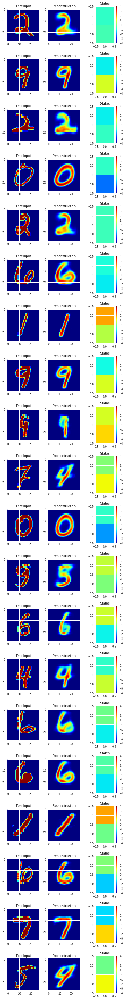

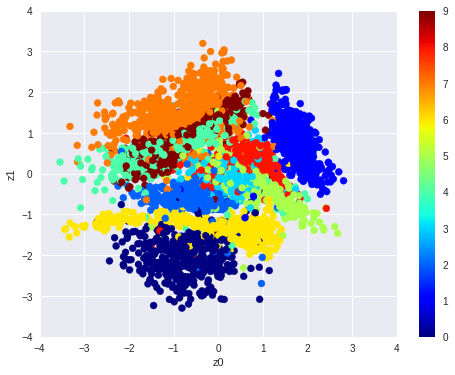

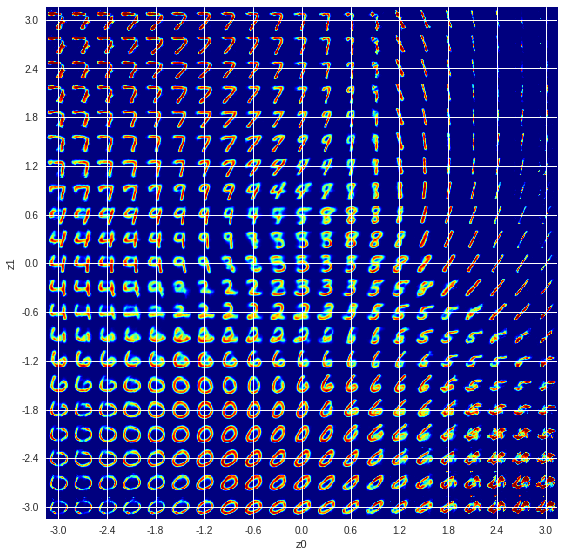

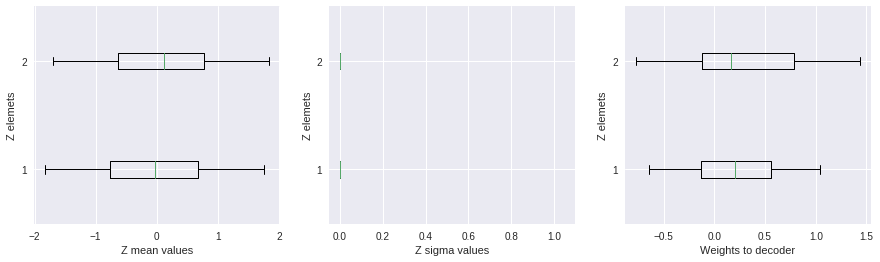

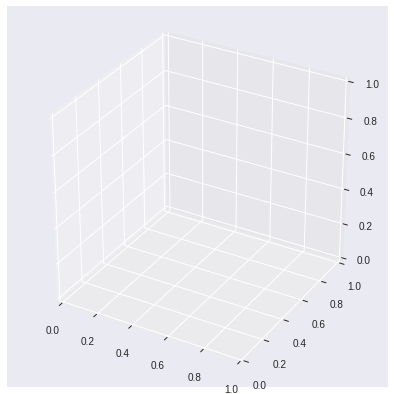

In [19]:
# vizualizacija rekonstrukcije i stanja
x_sample = mnist.test.next_batch(100)[0]
x_reconstruct, z_out = sess.run([x_reconstr_mean_out, z], feed_dict={x: x_sample})

draw_reconstructions(x_sample, x_reconstruct, z_out, (28, 28), (2,1)) # prilagodite dimenzije prema potrebi

# Vizualizacija raspored testnih uzoraka u 2D prostoru skrivenih varijabli - 1. način
x_sample, y_sample = mnist.test.next_batch(5000)
z_mu, z_sigma = sess.run((z_mean, z_log_sigma_sq), feed_dict={x: x_sample})
    
plot_latent(z_mu, y_sample)
#save_latent_plot('trt.png')

# Vizualizacija raspored testnih uzoraka u 2D prostoru skrivenih varijabli - 2. način

nx = ny = 21
x_values = np.linspace(-3, 3, nx)
y_values = np.linspace(-3, 3, ny)

canvas = np.empty((28*ny, 28*nx))

# Trikovito popunjavanje rezultata za grid zbog fiksirane veličine z batcha u grafu
# Valjda će se to riješiti u nekoj budućoj verziji TF
Xi, Yi = np.meshgrid(x_values, y_values)
Z = np.column_stack((Xi.flatten(), Yi.flatten()))
X = np.empty((0,28*28))
ind = list(range(batch_size, nx*ny, batch_size))
for i in np.array_split(Z,ind):
    if i.shape[0] < batch_size:
        i = np.concatenate((i, np.zeros((batch_size-i.shape[0], i.shape[1]))), 0)
    X = np.vstack((X, sess.run(x_reconstr_mean_out, feed_dict={z: i})))
    
for i, yi in enumerate(y_values):
    for j, xi in enumerate(x_values):
        canvas[(nx-i-1)*28:(nx-i)*28, j*28:(j+1)*28] = X[i*nx+j].reshape(28, 28)

plt.figure(figsize=(8, 10))
plt.imshow(canvas, origin="upper")
plt.xticks( np.linspace(14,588-14,11), np.round(np.linspace(-3,3,11), 2) )
plt.yticks( np.linspace(14,588-14,11), np.round(np.linspace(3,-3,11), 2) )
plt.xlabel('z0')
plt.ylabel('z1')
plt.tight_layout()

# Vizualizacija ugašenih elemenata skrivenog sloja - 1. način

# Pomoćna funkcija za crtanje boxplot grafova
def boxplot_vis(pos, input_data, label_x, label_y):
    ax = fig.add_subplot(130+pos)
    plt.boxplot(input_data, 0, '', 0, 0.75)
    ax.set_xlabel(label_x)
    ax.set_ylabel(label_y)
    return ax
   
fig = plt.figure(figsize=(15,4))

# Vizualizacija statistike za z_mean
boxplot_vis(1,z_mu, 'Z mean values', 'Z elemets')

# Vizualizacija statistike za z_sigma
ax = boxplot_vis(2, np.square(np.exp(z_sigma)), 'Z sigma values', 'Z elemets')
ax.set_xlim([-0.05,1.1])

# Vizualizacija statistike za težine ulaza u dekoder
test = tf.get_default_graph().get_tensor_by_name("layer_d1/weights:0")
weights_d1 = test.eval(session=sess)
boxplot_vis(3, weights_d1.T, 'Weights to decoder', 'Z elemets')


# Vizualizacija ugašenih elemenata skrivenog sloja - 2. način
from mpl_toolkits.mplot3d import Axes3D

# Funkcija za crtanje 3D bar grafa
def bargraph_vis(pos, input_data, dims, color, labels):
    ax = fig.add_subplot(120+pos, projection='3d')
    xpos, ypos = np.meshgrid(range(dims[0]), range(dims[1]))
    xpos = xpos.flatten('F')
    ypos = ypos.flatten('F')
    zpos = np.zeros_like(xpos)
    
    dx = np.ones_like(zpos) 
    dy = np.ones_like(zpos) * 0.5
    dz = input_data.flatten()
    
    ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=color)
    ax.view_init(elev=30., azim=5)
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])
    ax.set_zlabel(labels[2])
                             
fig = plt.figure(figsize=(15,7))

# 3D bar graf za z_mean
labels = ('Samples', 'Hidden elements', 'Z mean')
bargraph_vis(1, z_mu, [200, z_mu.shape[1]], 'g', labels)

# 3D bar graf za težine iz z_mena u dekoder
labels = ('Decoder elements', 'Hidden elements Z', 'Weights')
bargraph_vis(2, weights_d1.T, weights_d1.T.shape, 'y', labels)

**5. zadatak - GAN**

Extracting MNIST_data/train-images-idx3-ubyte.gz
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


/usr/local/lib/python3.6/dist-packages/tensorflow/python/client/session.py:1711: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


[1/20] loss_d: 1.600, loss_g: 1.839


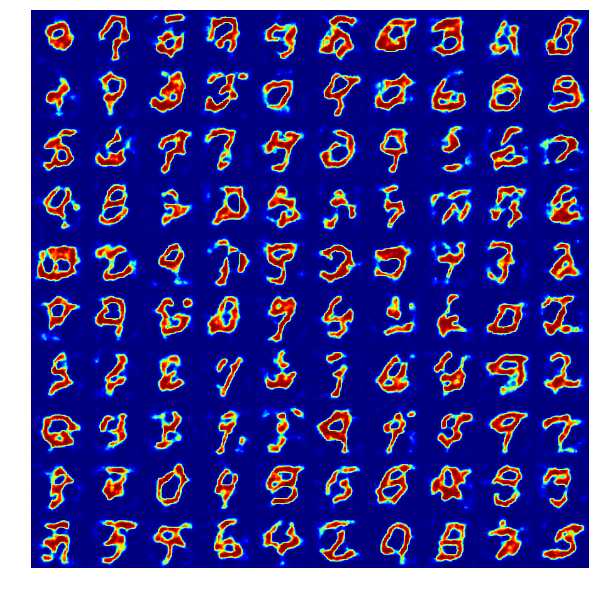

[2/20] loss_d: 1.262, loss_g: 0.676


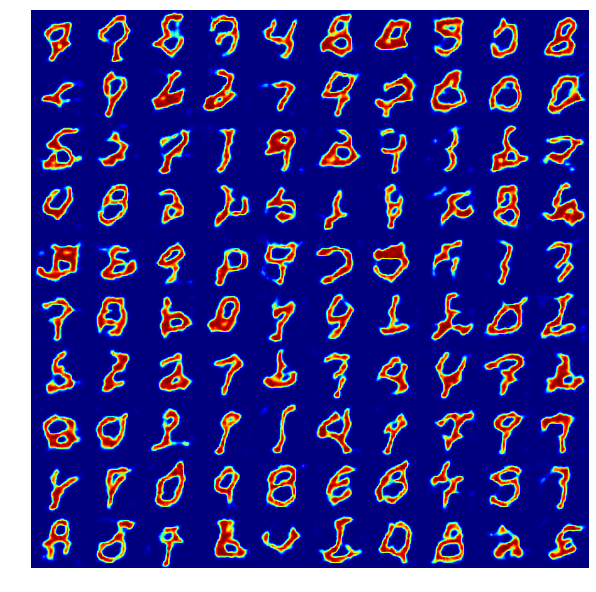

[3/20] loss_d: 1.172, loss_g: 0.523


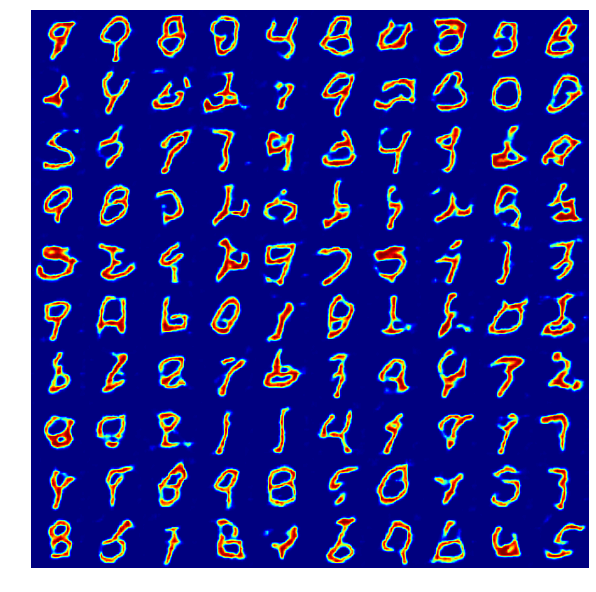

[4/20] loss_d: 0.813, loss_g: 1.545


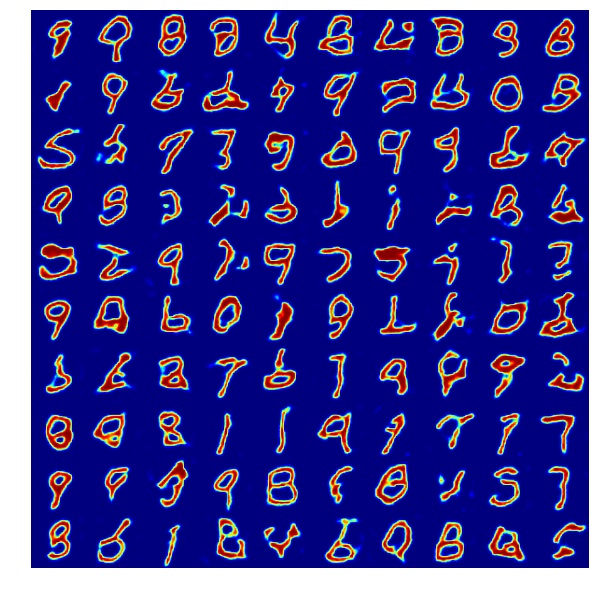

[5/20] loss_d: 1.296, loss_g: 0.757


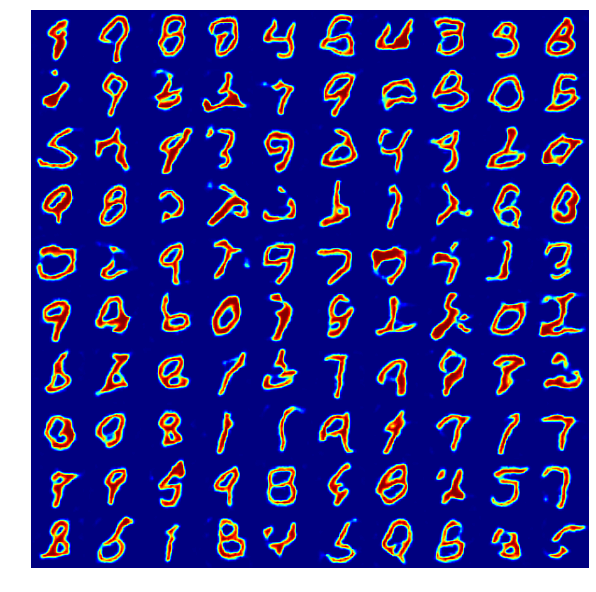

[6/20] loss_d: 1.311, loss_g: 0.498


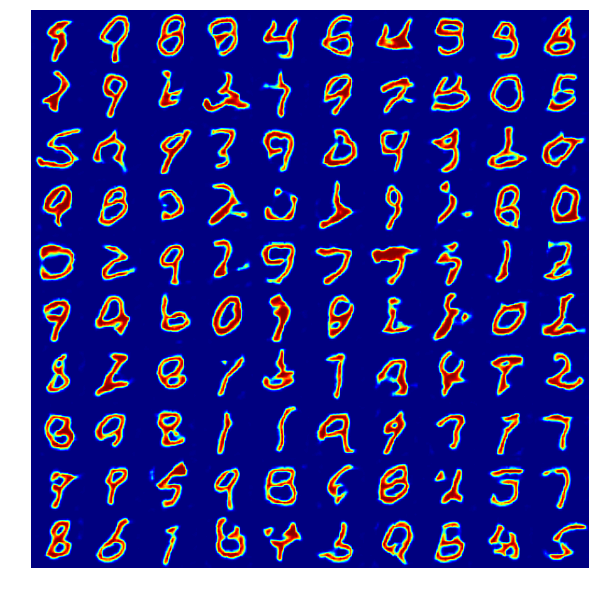

[7/20] loss_d: 0.841, loss_g: 1.789


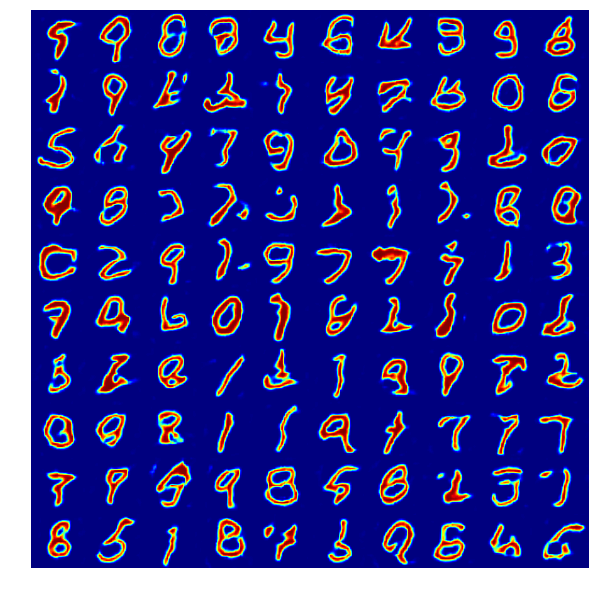

[8/20] loss_d: 0.499, loss_g: 2.233


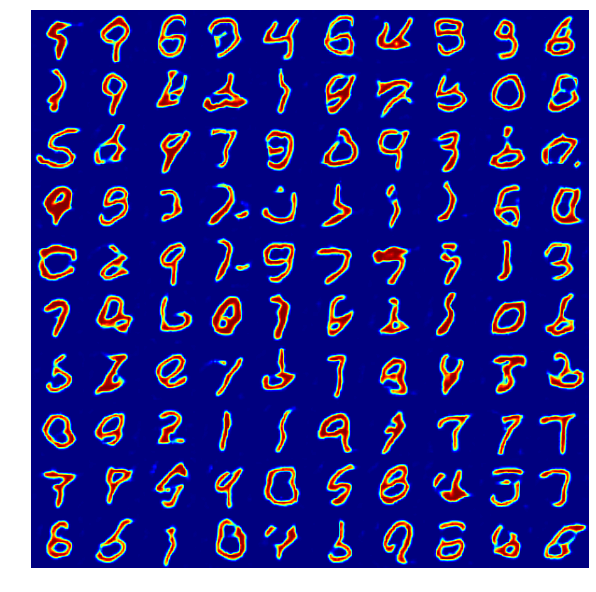

[9/20] loss_d: 0.412, loss_g: 2.098


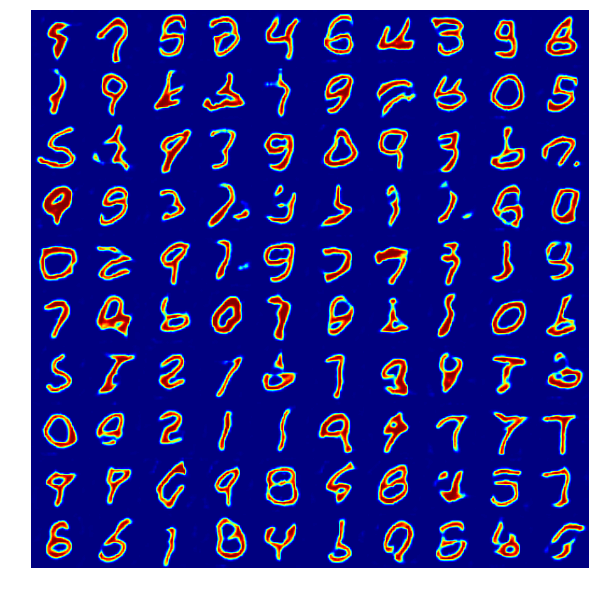

[10/20] loss_d: 0.323, loss_g: 2.465


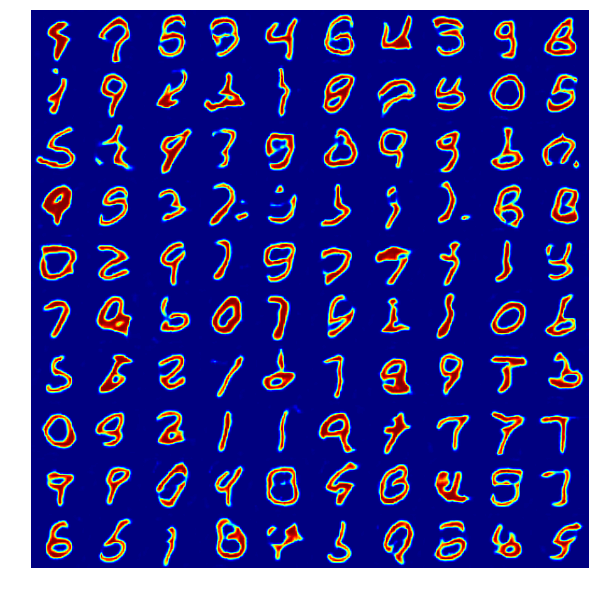

[11/20] loss_d: 0.261, loss_g: 2.489


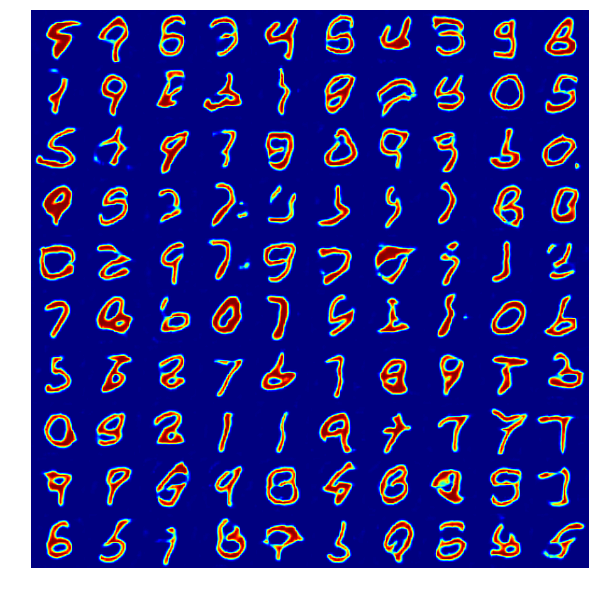

[12/20] loss_d: 0.232, loss_g: 2.823


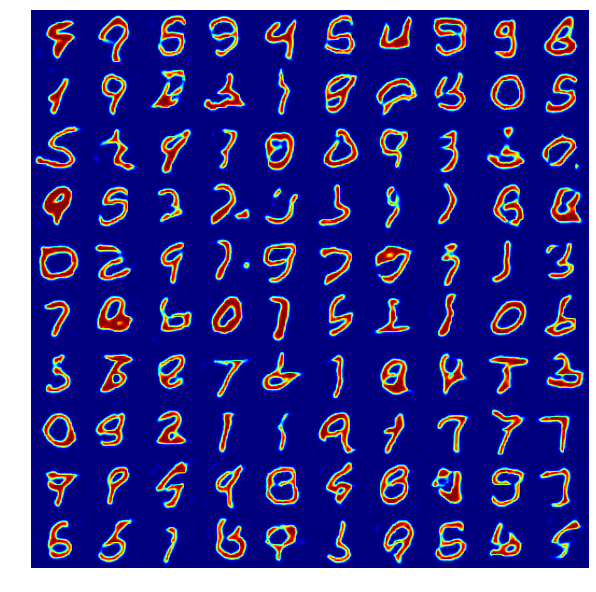

[13/20] loss_d: 0.182, loss_g: 3.143


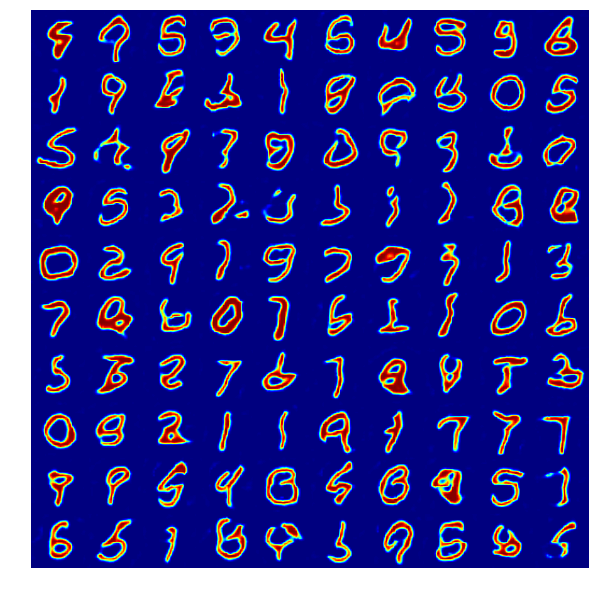

[14/20] loss_d: 0.209, loss_g: 3.640


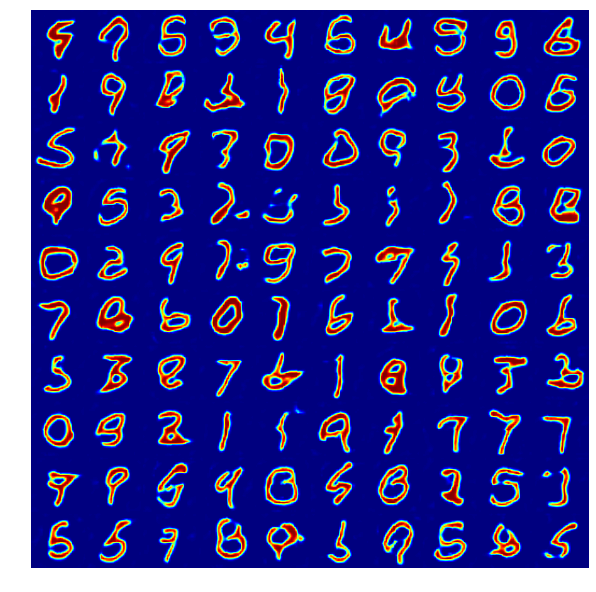

[15/20] loss_d: 0.152, loss_g: 3.514


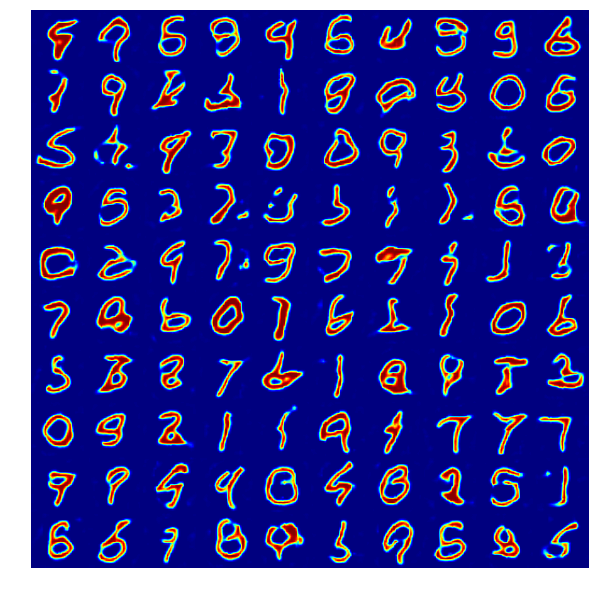

[16/20] loss_d: 0.200, loss_g: 3.867


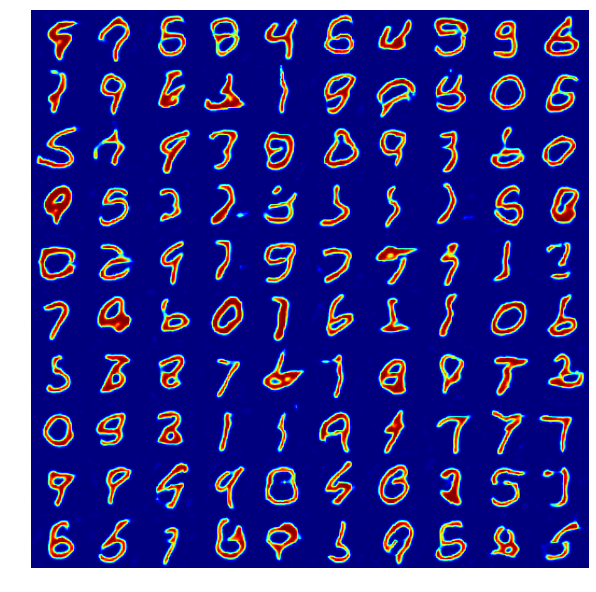

[17/20] loss_d: 0.093, loss_g: 3.694


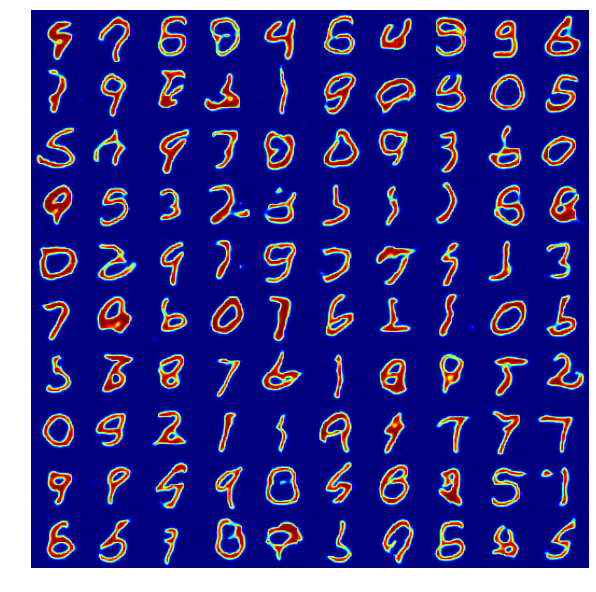

[18/20] loss_d: 0.091, loss_g: 3.623


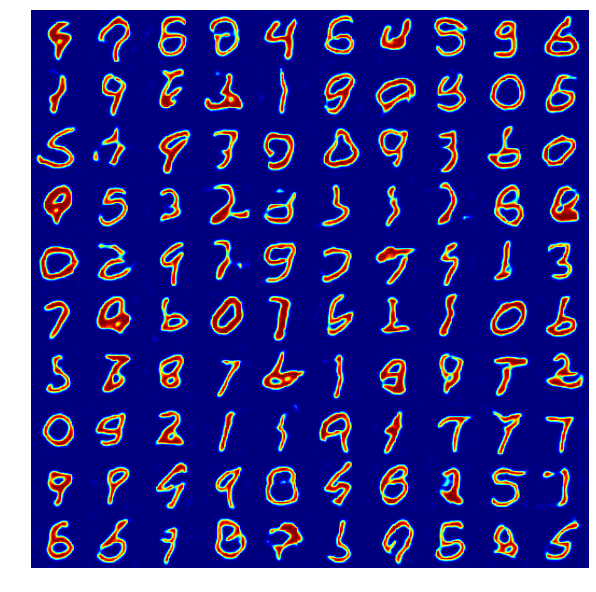

[19/20] loss_d: 0.096, loss_g: 3.777


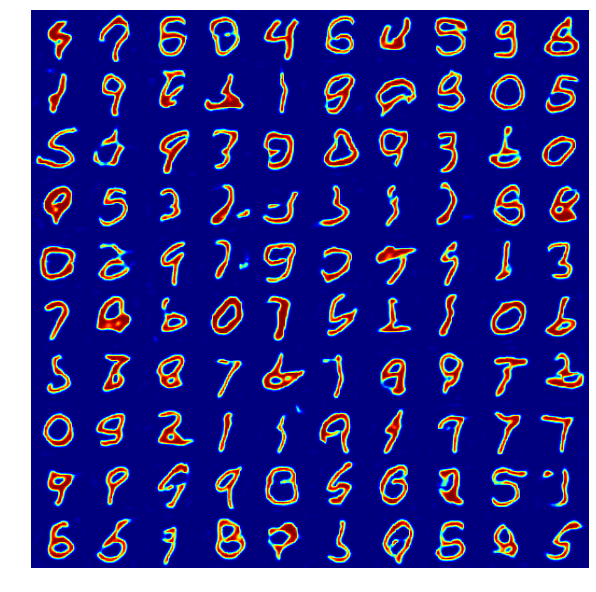

[20/20] loss_d: 0.082, loss_g: 3.987


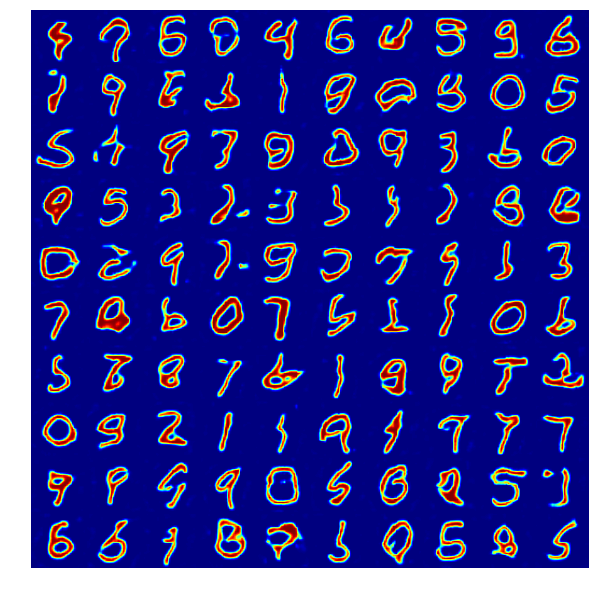

In [44]:
import numpy as np
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data
import matplotlib.pyplot as plt
import math

%matplotlib inline
plt.rcParams['image.cmap'] = 'jet'

mnist = input_data.read_data_sets("MNIST_data/", one_hot=True, reshape=[])
n_samples = mnist.train.num_examples

tf.reset_default_graph()

# training parameters
batch_size = 100
lr = 0.0002
n_epochs = 20

def lrelu(x, th=0.2):
    return tf.maximum(th * x, x)

# D(x)
def discriminator(x, isTrain=True, reuse=False):
    with tf.variable_scope('discriminator', reuse=reuse):
        # 1st hidden layer
        conv1 = tf.layers.conv2d(x, 64, [4, 4], strides=(2, 2), padding='same')
        lrelu1 = lrelu(conv1, 0.2)
        
        # 2nd hidden layer
        conv2 = tf.layers.conv2d(lrelu1, 128, [4, 4], strides=(2, 2), padding='same')
        lrelu2 = lrelu(tf.layers.batch_normalization(conv2, training=isTrain), 0.2)

        
        # output layer
        conv3 = tf.layers.conv2d(lrelu2, 1, [8, 8], strides=(1, 1), padding='valid')
        out = tf.nn.sigmoid(conv3)
        
        return out, conv3

# G(z)
def generator(z, isTrain=True):
    with tf.variable_scope('generator'):
        # 1st hidden layer
        conv1 = tf.layers.conv2d_transpose(z, 512, [4, 4], strides=(1, 1), padding='valid')
        lrelu1 = lrelu(tf.layers.batch_normalization(conv1, training=isTrain))
        
        # 2nd hidden layer
        conv2 = tf.layers.conv2d_transpose(lrelu1, 256, [4, 4], strides=(2, 2), padding='same')
        lrelu2 = lrelu(tf.layers.batch_normalization(conv2, training=isTrain), 0.2)

        # 3rd hidden layer
        conv3 = tf.layers.conv2d_transpose(lrelu2, 128, [4, 4], strides=(2, 2), padding='same')
        lrelu3 = lrelu(tf.layers.batch_normalization(conv3, training=isTrain), 0.2)

        # output layer
        conv4 = tf.layers.conv2d_transpose(lrelu3, 1, [4, 4], strides=(2, 2), padding='same')
        out = tf.nn.tanh(conv4)
        
        return out

def show_generated(G, N, shape=(32,32), stat_shape=(10,10), interpolation="bilinear"):
    """Visualization of generated samples
     G - generated samples
     N - number of samples
     shape - dimensions of samples eg (32,32)
     stat_shape - dimension for 2D sample display (eg for 100 samples (10,10)
    """
    
    image = (tile_raster_images(
        X=G,
        img_shape=shape,
        tile_shape=(int(math.ceil(N/stat_shape[0])), stat_shape[0]),
        tile_spacing=(1, 1)))
    plt.figure(figsize=(10, 14))
    plt.imshow(image, interpolation=interpolation)
    plt.axis('off')
    plt.show()
    

def gen_z(N, batch_size):
    z = np.random.normal(0, 1, (batch_size, 1, 1, N))
    return z

# input variables
x = tf.placeholder(tf.float32, shape=(None, 32, 32, 1))
z = tf.placeholder(tf.float32, shape=(None, 1, 1, 100))
isTrain = tf.placeholder(dtype=tf.bool)
    
# generator
G_z = generator(z, isTrain)
    
# discriminator
# real
D_real, D_real_logits = discriminator(x, isTrain)
# fake
D_fake, D_fake_logits = discriminator(G_z, isTrain, reuse=True)


# labels for learning
true_labels = tf.ones([batch_size, 1, 1, 1])
fake_labels = tf.zeros([batch_size, 1, 1, 1])
# loss for each network                       
D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_real_logits, labels=true_labels))
D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_fake_logits, labels=fake_labels))
D_loss = D_loss_real + D_loss_fake
G_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_fake_logits, labels=true_labels))

# trainable variables for each network
T_vars = tf.trainable_variables()
D_vars = [var for var in T_vars if var.name.startswith('discriminator')]
G_vars = [var for var in T_vars if var.name.startswith('generator')]

# optimizer for each network
with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
    D_optim = tf.train.AdamOptimizer(lr, beta1=0.3).minimize(D_loss, var_list=D_vars)
    G_optim = tf.train.AdamOptimizer(lr, beta1=0.3).minimize(G_loss, var_list=G_vars)


# open session and initialize all variables
config = tf.ConfigProto()
config.gpu_options.allow_growth=True
sess = tf.InteractiveSession(config=config)
tf.global_variables_initializer().run()

# MNIST resize and normalization
train_set = tf.image.resize_images(mnist.train.images, [32, 32]).eval()
# input normalization
train_set = (train_set - 0.5) / 0.5  # normalization; range: -1 ~ 1


#fixed_z_ = np.random.uniform(-1, 1, (100, 1, 1, 100))
fixed_z_ = gen_z(100, 100)
total_batch = int(n_samples / batch_size)

for epoch in range(n_epochs):
    for iter in range(total_batch):
        # update discriminator
        x_ = train_set[iter*batch_size:(iter+1)*batch_size]
        
        # update discriminator
        z_ = gen_z(100, batch_size)
        loss_d_, _ = sess.run([D_loss, D_optim], {x: x_, z: z_, isTrain: True})
                

        # update generator
        z_ = np.random.normal(0, 1, (batch_size, 1, 1, 100))
        loss_g_, _ = sess.run([G_loss, G_optim], {z: z_, x: x_, isTrain: True})
            
    print('[%d/%d] loss_d: %.3f, loss_g: %.3f' % ((epoch + 1), n_epochs, loss_d_, loss_g_))
    
    test_images = sess.run(G_z, {z: fixed_z_, isTrain: False})
    show_generated(test_images, 100)